Importer les données 

In [14]:
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import train_test_split 
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report
from sklearn.model_selection import GridSearchCV
import pandas as pd
import numpy as np
# une commande qui permet d'afficher le graphique directement en dessous au lieu d'ouvrir un nouvel onglet 
%matplotlib inline 
import matplotlib.pyplot as plt
import seaborn as sns

# creation de la dataframe 
data = load_breast_cancer()
df = pd.DataFrame(data.data, columns=data.feature_names)
# Pour rajouter une colonne pour la classification 
df["target"] = data.target
# Pour visualiser les cinq premières et dernières lignes du dataframe
df.head(-10)

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
0,17.990,10.38,122.80,1001.0,0.11840,0.27760,0.300100,0.14710,0.2419,0.07871,...,17.33,184.60,2019.0,0.1622,0.66560,0.71190,0.26540,0.4601,0.11890,0
1,20.570,17.77,132.90,1326.0,0.08474,0.07864,0.086900,0.07017,0.1812,0.05667,...,23.41,158.80,1956.0,0.1238,0.18660,0.24160,0.18600,0.2750,0.08902,0
2,19.690,21.25,130.00,1203.0,0.10960,0.15990,0.197400,0.12790,0.2069,0.05999,...,25.53,152.50,1709.0,0.1444,0.42450,0.45040,0.24300,0.3613,0.08758,0
3,11.420,20.38,77.58,386.1,0.14250,0.28390,0.241400,0.10520,0.2597,0.09744,...,26.50,98.87,567.7,0.2098,0.86630,0.68690,0.25750,0.6638,0.17300,0
4,20.290,14.34,135.10,1297.0,0.10030,0.13280,0.198000,0.10430,0.1809,0.05883,...,16.67,152.20,1575.0,0.1374,0.20500,0.40000,0.16250,0.2364,0.07678,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
554,12.880,28.92,82.50,514.3,0.08123,0.05824,0.061950,0.02343,0.1566,0.05708,...,35.74,88.84,595.7,0.1227,0.16200,0.24390,0.06493,0.2372,0.07242,1
555,10.290,27.61,65.67,321.4,0.09030,0.07658,0.059990,0.02738,0.1593,0.06127,...,34.91,69.57,357.6,0.1384,0.17100,0.20000,0.09127,0.2226,0.08283,1
556,10.160,19.59,64.73,311.7,0.10030,0.07504,0.005025,0.01116,0.1791,0.06331,...,22.88,67.88,347.3,0.1265,0.12000,0.01005,0.02232,0.2262,0.06742,1
557,9.423,27.88,59.26,271.3,0.08123,0.04971,0.000000,0.00000,0.1742,0.06059,...,34.24,66.50,330.6,0.1073,0.07158,0.00000,0.00000,0.2475,0.06969,1


Description statistique des données 

In [15]:
# permet de décrire statistiquement les données du dataframe 
df.describe()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,...,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946,0.627417
std,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,...,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061,0.483918
min,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,...,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040,0.000000
25%,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,...,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460,0.000000
50%,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,...,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040,1.000000
75%,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,...,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080,1.000000
max,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,...,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500,1.000000


Afficher les données de manière visuelle pour mieux les comprendre

In [16]:
!pip install seaborn


[notice] A new release of pip is available: 25.1.1 -> 25.2
[notice] To update, run: C:\Users\buket\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


Visualiser les données 

In [17]:
# permet de créer une figure sur laquelle on voit toutes les relations entre nos différentes colonnes 
sns.pairplot(df)

<Axes: xlabel='mean radius', ylabel='worst texture'>

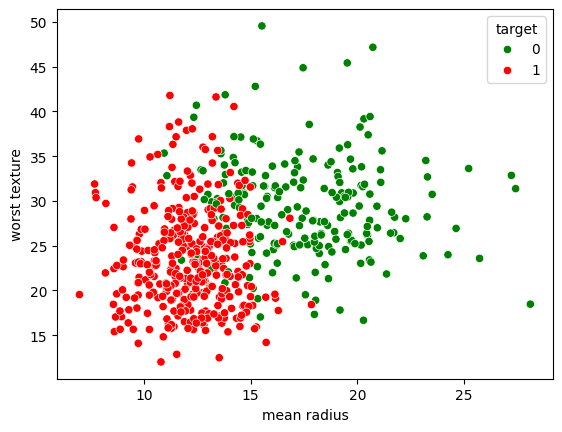

In [18]:
# Pour visualiser la relation entre deux features et mettre les tumeurs en vert (bénin) ou rouge (malin) 
sns.scatterplot(
    data=df,
    x="mean radius",
    y="worst texture",
    hue="target",  # 0 ou 1
    palette={0: "green", 1: "red"},
)


Heatmap pour voir le lien entres les données 

<Axes: >

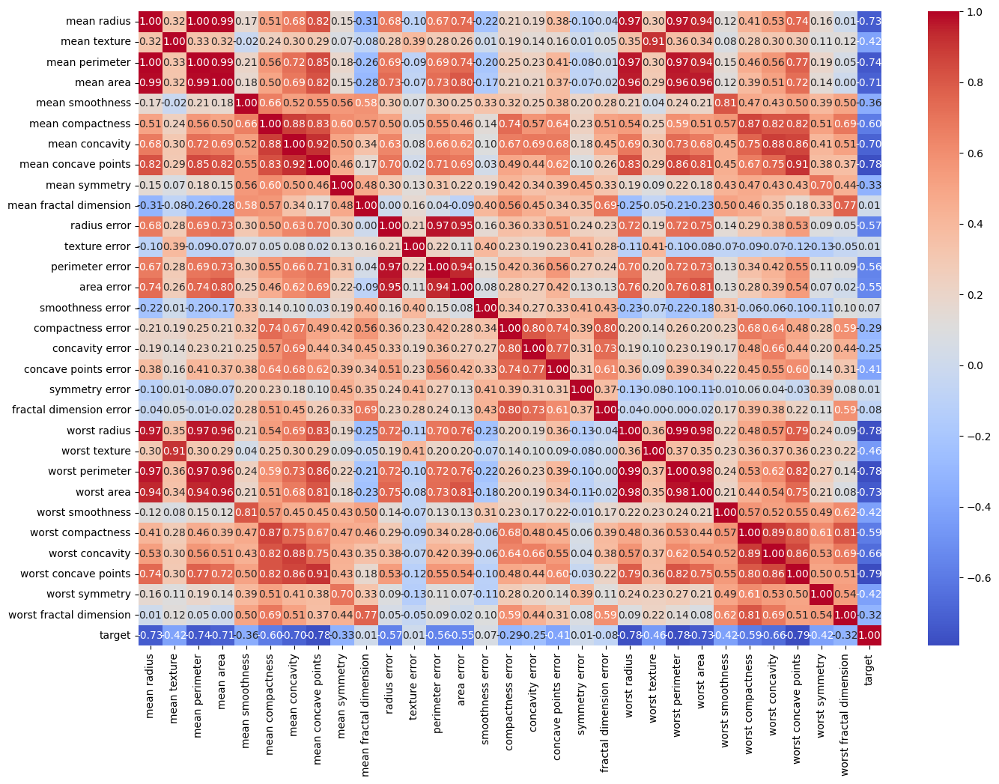

In [19]:
# on trace une grande figure pour pouvoir voir toutes les données 
plt.figure(figsize=(16, 11))
# on arrondi à deux chiffres après la virgule et on utilise la colorimétrie coolwarm pour aller du plus chaud au plus froid 
sns.heatmap(df.corr(), annot=True, fmt=".2f", cmap="coolwarm") 

Lecture des données : ici quand les valeurs sont proches de 1, cela signifie que les variables sont corrélées. Par exemple quand mean radius augmente, worst radius augmente aussi car la case qui relie les deux variables indique 0.97 donc on est très proche de 1. Le fait d'analyser ces données permet de repérer les variables redondantes et ne pas toutes les utiliser pour entrainer le modèle. 

Première observation : la diagonale a toujours la même valeur, à savoir 1. Cette diagonale ne sera donc pas significative pour l'analyse et le choix des données. 

Deuxième observation : quand on regarde les valeurs au dessus et en dessous de la diagonale, elles sont redondantes donc pas besoin d'utiliser l'entireté de la heatmap pour séléctionner les données à entrainer, la moitié suffit. 


In [20]:
# Utiliser les valeurs absolues 
corr_matrix = df.corr().abs()

# Supprimer les valeurs égales à 1 donc la diagonale et garder que celles du dessus de la diagonale 
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# Supprimer les colonnes redondantes 
to_drop = [column for column in upper.columns if any(upper[column] > 0.9)]
df_reduit = df.drop(columns=to_drop)

# Afficher le résultat 
print("Variables supprimées :", to_drop)
print("Dimensions du nouveau DataFrame :", df_reduit.shape)

Variables supprimées : ['mean perimeter', 'mean area', 'mean concave points', 'perimeter error', 'area error', 'worst radius', 'worst texture', 'worst perimeter', 'worst area', 'worst concave points']
Dimensions du nouveau DataFrame : (569, 21)


Représentation visuelle de la nouvelle heatmap 

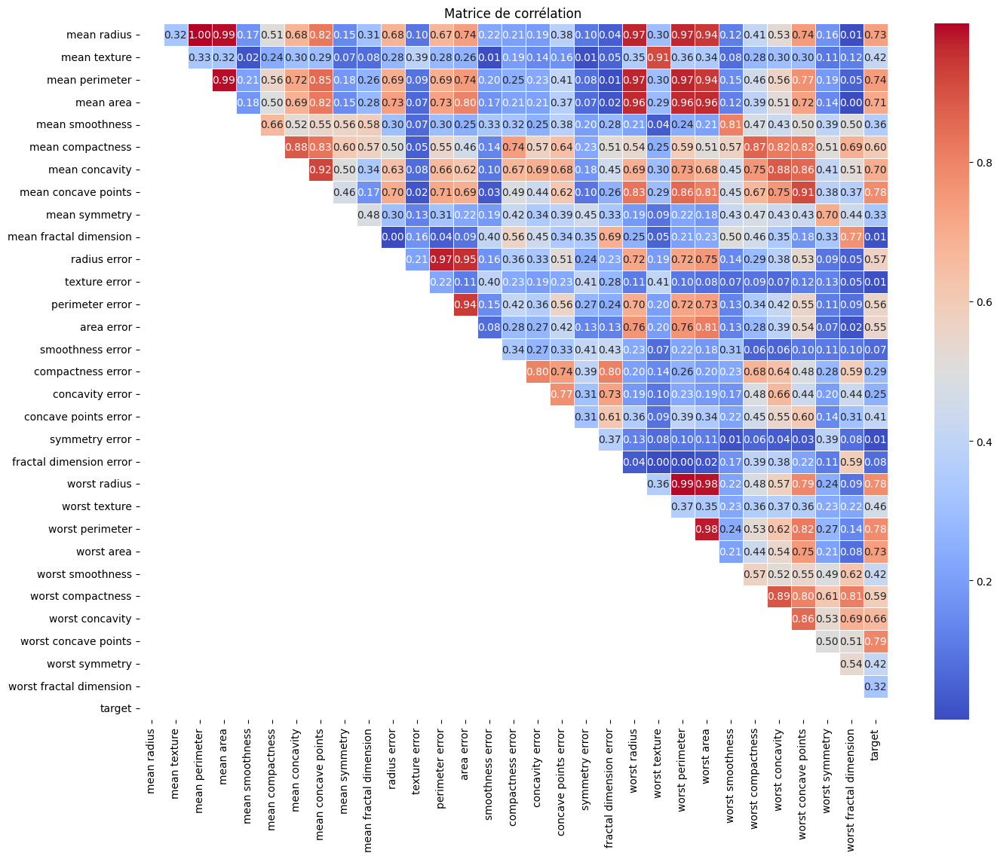

In [21]:
# La corrélation en valeur absolue
corr_matrix = df.corr().abs()

# Masquer la moitié inférieure + diagonale
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# Affichage de la heatmap
plt.figure(figsize=(16, 12))
sns.heatmap(upper, cmap="coolwarm", annot=True, fmt=".2f", linewidths=0.5)
plt.title("Matrice de corrélation")
plt.show()

Déterminer la corrélation entre les différentes variables et la target 

In [22]:
# Calculer la corrélation entre les variables et la target en enlevant target (car égal à )
correlations = df_reduit.corr()["target"].drop("target")

In [23]:
# Afficher les valeurs absolues car positif ou négatif sans importance, on veut juste faire le lien avec target 
# Ascending=False permet de trier les valeurs du plus grand au plus petit car plus le nombre est proche de 1, plus il est corrélé avec target
correlations = correlations.abs().sort_values(ascending=False)

In [24]:
# Affiche les 10 variables les plus corrélées 
top_features = correlations.head(10).index.tolist()
print("Top variables :", top_features)

Top variables : ['mean radius', 'mean concavity', 'worst concavity', 'mean compactness', 'worst compactness', 'radius error', 'worst smoothness', 'worst symmetry', 'mean texture', 'concave points error']


Représentation visuelle de la nouvelle heatmap 

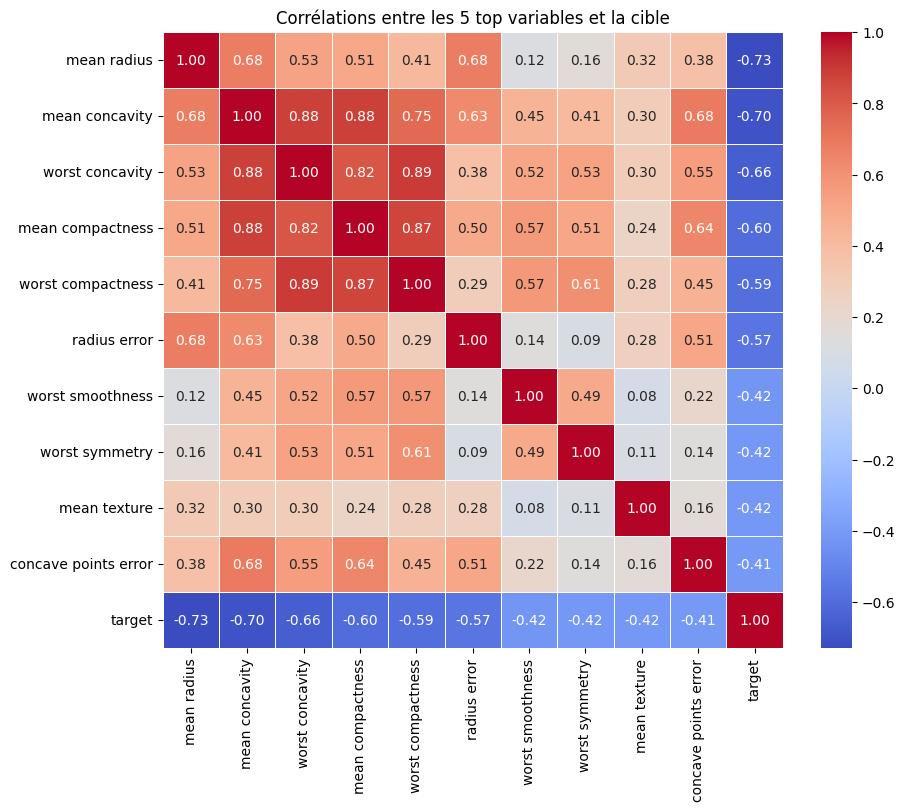

In [25]:
# Ajouter "target" pour voir les corrélations 
features_for_heatmap = top_features + ["target"]

# Créer la matrice de corrélation réduite
corr_matrix = df[features_for_heatmap].corr()

# Afficher la nouvelle heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Corrélations entre les 5 top variables et la cible")
plt.show()

Créer un dataset d'entrainement et un dataset de test 

In [26]:
# Définir les features avec x 
df_reduit = df.drop(columns=to_drop)
X = df_reduit[top_features]

# Définir la target avec y 
df["target"] = data.target
y = df["target"]

# Utilise 20% des données pour le test c'est une norme en ML
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
) 
# Utiliser 42 pour le random state (convention en ML) = la machine va générer la même séquence de nombres aléatoires à chaque fois qu'on lance le code 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)
print('Train dataset:', X_train.shape, 'Test dataset:', X_test.shape)
X_train.head(5)

Train dataset: (455, 10) Test dataset: (114, 10)


,mean radius,mean concavity,worst concavity,mean compactness,worst compactness,radius error,worst smoothness,worst symmetry,mean texture,concave points error
546,10.32,0.01012,0.04384,0.04994,0.08842,0.2104,0.1285,0.2681,16.35,0.005495
432,20.18,0.21330,0.53080,0.14890,0.29420,0.4331,0.1665,0.3032,19.54,0.019100
174,10.66,0.00000,0.00000,0.04302,0.06791,0.3309,0.1076,0.2710,15.15,0.000000
221,13.56,0.07860,0.25770,0.11920,0.26980,0.2569,0.1376,0.3065,13.90,0.008360
289,11.37,0.02399,0.07529,0.05008,0.09708,0.2656,0.1118,0.3267,18.89,0.009924


Entrainement du modèle avec un arbre de décision

Réaliser un Grid Search pour définir les bonnes valeurs pour max_depth (profondeur max de l'arbre de décision) et min_samples_leaf (nbr min d'échantillons dans une feuille de l'arbre)

Ici on donne pas plus de 6 pour le max_depth car plus il y aura de pronfondeur, plus il y aura de réponses tranchées (1 ou 0) et nous ne pourrons pas avoir une courbe ROC et un seuil utilisable. 

Pareil pour le min_samples_leaf : si le nombre est bas, cela signifie qu'avec peu de données, l'abre peu créer de nouvelles feuilles donc il y a un risque de surapprentissage. L'idéal est alors de commencer avec minimum 5. 

In [27]:
param_grid = {
    'max_depth': [4,5,6],
    'min_samples_leaf': [5,10,20]
}
grid = GridSearchCV(DecisionTreeClassifier(random_state=42), param_grid, cv=5)
grid.fit(X_train, y_train)

print("Meilleurs paramètres :", grid.best_params_)
print("Score sur les données de test :", grid.score(X_test, y_test))

Meilleurs paramètres : {'max_depth': 5, 'min_samples_leaf': 5}
Score sur les données de test : 0.9298245614035088


In [28]:
model = DecisionTreeClassifier (
    max_depth=5,
    min_samples_leaf=5,
    random_state=42
)
# Pour entrainer 
model.fit (X_train, y_train)

,criterion,'gini'
,splitter,'best'
,max_depth,5
,min_samples_split,2
,min_samples_leaf,5
,min_weight_fraction_leaf,0.0
,max_features,None
,random_state,42
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,class_weight,None


In [29]:
# Variable pour afficher les predictions du modèle sur les données test qu'il n'a pas encore vu
y_prediction = model.predict(X_test)

In [30]:
# Evaluer la performance du modèle
print("Accuracy:", accuracy_score(y_test, y_prediction))
print(classification_report(y_test, y_prediction))

Accuracy: 0.9298245614035088
              precision    recall  f1-score   support

           0       0.90      0.90      0.90        42
           1       0.94      0.94      0.94        72

    accuracy                           0.93       114
   macro avg       0.92      0.92      0.92       114
weighted avg       0.93      0.93      0.93       114



Tracer la courbe ROC (Receiver Operating Characteristic) 

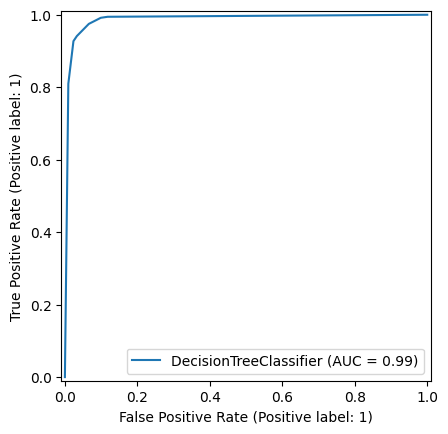

In [31]:
from sklearn.metrics import RocCurveDisplay 
RocCurveDisplay.from_estimator(model, X, y)
plt.show()

Faire ressortir la valeur du seuil idéal 

In [32]:
# Probabilité d’être classe 1 (maligne)
y_scores = model.predict_proba(X_test)[:, 1]  

In [33]:
from sklearn.metrics import roc_curve
fpr, tpr, thresholds = roc_curve(y_test, y_scores)

In [34]:
# Utiliser l'index Youden pour trouver le meilleur taux tpr - fpr
youden_index = tpr - fpr 
index = youden_index.argmax()
optimal_threshold = thresholds[index]
print("Seuil optimal :", optimal_threshold)

Seuil optimal : 0.4


Représentation visuelle du seuil idéal 

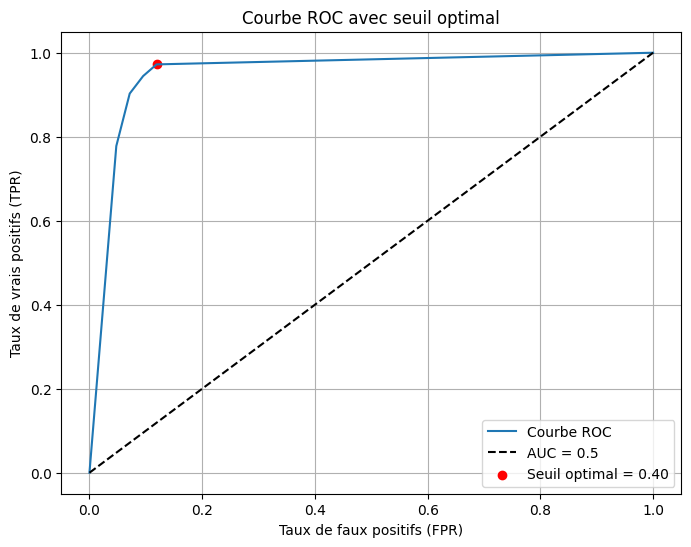

In [35]:
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label="Courbe ROC")
plt.plot([0, 1], [0, 1], 'k--', label="AUC = 0.5")

# Point du seuil optimal
plt.scatter(fpr[index], tpr[index], color='red', label=f"Seuil optimal = {optimal_threshold:.2f}")

plt.xlabel("Taux de faux positifs (FPR)")
plt.ylabel("Taux de vrais positifs (TPR)")
plt.title("Courbe ROC avec seuil optimal")
plt.legend()
plt.grid(True)
plt.show()

Conclusion

La qualité des données : Est-ce que les données sont suffisament variées ? 

On travaille avec un dataset complet avec aucune donnée manquante, ce qui rend le modèle plus fiable. 
En revanche nous n'avons aucune information sur l'âge des femmes ou le pays dans lequel elles habitent par exemple. Ces informations pourraient permettre de construire un modèle plus fiable et comprendre si le modèle est transposable dans d'autres pays. 
Autre information importante, ces données datent de 1995. Or depuis cette date, la technologie d'imagerie médicale a largement évolué (tomosynthèse mammaire, passage à la mammographie numérique, imagerie mammaire à contraste amélioré etc.) donc les mesures présentent dans le dataset sont elles-même peut-être eronnées, compte tenu du manque de précision des instruments de mesure de l'époque. 

La complexité du modèle/ fiabilité : 

Le poids de chaque target (tumeur maligne et bénigne) est également contestable dans le sens où le dataset 
d'entrainement ne possède pas un même nombre de tumeurs malignes et bénignes. Sur les 569 cas étudiés, 212 sont des tumeurs malignes et 357 sont des tumeurs bénignes. Cela représente un biais dans le sens où le modèle peut se concentrer sur l'apprentissage des cas qui sont majoritaires, ici ce sont les cas bénins. Or tout l'enjeu d'une IA santé est de pouvoir détecter au mieux les personnes atteintes de la maladie. 

Choix des variables : 

J'ai choisi d'entrainer le modèle en me basant sur 10 variables. Grâce aux différentes heatmaps, j'ai pu identifier des redondances entre les données et sélectionner uniquement les plus pertinentes. 

Choix du modèle : 

J'ai choisi d'utiliser un arbre de décision pour entrainer mon modèle car je débute en Machine Learning donc j'essaie d'apprendre les approches les plus simples pour commencer. La limite de ce modèle, c'est la forte sensibilité à la variance. Une légère modification dans les données peut changer fortement le résultat final. Ce qui rend le modèle beaucoup moins fiable et pas idéal pour une utilisation dans le domaine de la santé. 

Solution d'amélioration : le site de la Wisconsin University préconise d'utiliser le Random Forest Classification, fiable et précis à presque 98% sur ce dataset. 

Les biais et limites du modèle : 

Ce dataset se base principalement sur l'aspect de la tumeur or les études montrent que le temps de croissance de la tumeur peut jouer un rôle important dans le diagnostic et le traitement. En clair, la vitesse de croissance de la tumeur donne des informations supplémentaires sur l'aspect malin ou bénin de la tumeur. Or dans ce dataset, il n'y a aucune indication à ce sujet. Une solution serait d'ajouter ces données au dataset car cela permettrait de personnaliser le diagnostic et le traitement. 